# **Training HRPlane Dataset with YOLOv8x: Experiment No. 14**

<p align="center">
    <img src="https://github.com/RSandAI/Comprehensive-YOLO-Airplane-Detection/blob/main/assets/image.png" height=450 width=1280 alt=""/>
</p>

<small>Picture Source: <a href="https://github.com/RSandAI/Comprehensive-YOLO-Airplane-Detection/">RSandAI, Comprehensive YOLO Airplane Detection</a></small>

<br>

## **Context**

The HRPlanes dataset is a valuable resource in the domain of computer vision, particularly for tasks related to object detection, specifically focusing on aircraft within Very High Resolution (VHR) Google Earth images. This dataset comprises 3101 RGB images of major airports and aircraft boneyards, manually annotated with bounding boxes for airplanes using Plainsight (formerly HyperLabel). Quality control was conducted independently, resulting in 18,477 annotated airplanes. The dataset is split into 70% training (2170 images), 20% validation (620 images), and 10% testing (311 images) sets.

<br>

To facilitate accurate training and evaluation, each aircraft within the images has been meticulously labeled, resulting in a comprehensive annotation set covering a total of 18,477 aircraft instances. These annotations provide bounding box coordinates for each detected aircraft within the corresponding images.

<br>

Given the specifics of the HRPlanes dataset and its annotations, training object detection models like YOLOv8 would involve leveraging this rich dataset to teach the model to accurately detect and localize aircraft within VHR Google Earth images. This process would entail feeding the dataset into the YOLOv8 model architecture and iteratively training the model until satisfactory performance metrics are achieved. Access to the HRPlanes dataset provides researchers, practitioners, and developers with a valuable asset for advancing the state-of-the-art in aircraft detection algorithms, with potential applications spanning aviation security, urban planning, and defense intelligence. The dataset's availability ensures its accessibility to the wider computer vision community, fostering collaboration and innovation in this domain.

**Hyperparameters:**

| Epochs | Network size | Batch size | LR | Optimizer | Hue | Saturation | Value | Mosiac |
|--|--|--|--|--|--|--|--|--|
| 100 | 960x960 | 16 | 0.001 | AdamW | 0.015 | 0.7 | 0.4 | 1.0 |

<br>

Make sure your runtime is **GPU** (_not_ CPU or TPU). And if it is an option, make sure you are using _Python 3_. You can select these settings by going to `Runtime -> Change runtime type -> Select the above mentioned settings and then press SAVE`.

## **0. Initial Steps**

### **0.1 Download Library**

In [ ]:
!pip install ultralytics -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 755.0/755.0 kB 13.3 MB/s eta 0:00:00


### **0.2. Import Libraries and Connect Google Drive**

In [ ]:
from google.colab import drive
drive.mount('/gdrive')

Mounted at /gdrive


In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pandas as pd
import numpy as np
import json
import shutil
import seaborn as sns
import os
from ultralytics import YOLO

### **0.3. Define Paths and Hyperparameters**

In [ ]:
# @markdown ---

BASE_DIRECTORY = '/gdrive/MyDrive/Datasets/HRPlanes/YOLOV8/YOLOv8x/Experiment_No_14/' # @param {type:"string"}
if os.path.exists(BASE_DIRECTORY):
    print(f"Base directory already exists: {BASE_DIRECTORY}")
else:
    os.makedirs(BASE_DIRECTORY)
    print(f"Created base directory: {BASE_DIRECTORY}")

SAVE_DIR = BASE_DIRECTORY + 'outputs'
if os.path.exists(SAVE_DIR):
    print(f"Save directory already exists: {SAVE_DIR}")
else:
    os.makedirs(SAVE_DIR)
    print(f"Created save directory: {SAVE_DIR}")

# @markdown ---

IMAGE_SIZE = 960 # @param {type:"integer"}
BATCH = 16 # @param {type:"integer"}
LR = 0.001 # @param {type:"number"}
OPTIMIZER = 'AdamW' # @param {type:"string"}

# @markdown ---

HUE = 0.015 # @param {type:"number"}
SATURATION = 0.7 # @param {type:"number"}
VALUE = 0.4 # @param {type:"number"}
MOSIAC = 1.0 # @param {type:"number"}

# @markdown ---

Created base directory: /gdrive/MyDrive/Datasets/HRPlanes/YOLOV8/YOLOv8x/Experiment_No_14/
Created save directory: /gdrive/MyDrive/Datasets/HRPlanes/YOLOV8/YOLOv8x/Experiment_No_14/outputs


## **1. Train the Model**

The A100 GPU is a powerful graphics processing unit (GPU) developed by NVIDIA. It is part of the NVIDIA Ampere architecture and is designed for high-performance computing tasks, including deep learning, data analytics, and scientific computing. The A100 GPU offers significant improvements in performance and efficiency compared to previous GPU models, making it ideal for demanding AI and machine learning applications.

In [ ]:
!nvidia-smi

Thu May  2 05:26:02 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA A100-SXM4-40GB          Off | 00000000:00:04.0 Off |                    0 |
| N/A   46C    P0              49W / 400W |      2MiB / 40960MiB |      0%      Default |
|                                         |                      |             Disabled |
+-----------------------------------------+----------------------+--

### **1.1. Train Model**

YOLOv8x refers to a variant of the YOLO (You Only Look Once) object detection model, specifically based on the YOLOv4 architecture. YOLOv4 is a state-of-the-art deep learning model used for real-time object detection tasks. The "x" in YOLOv8x typically denotes an extended or modified version of the original model, possibly with improvements or adjustments.

In [ ]:
model = YOLO('/gdrive/MyDrive/Datasets/HRPlanes_ds/yolov8x.pt')

In [ ]:
%load_ext tensorboard

In [ ]:
results = model.train(data='/gdrive/MyDrive/Datasets/HRPlanes/YOLOV8/coco.yaml', epochs=100, imgsz=IMAGE_SIZE, batch=BATCH, lr0=LR, optimizer=OPTIMIZER, hsv_h=HUE, hsv_s=SATURATION, hsv_v=VALUE, mosaic=MOSIAC)

Ultralytics YOLOv8.2.6 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=detect, mode=train, model=/gdrive/MyDrive/Datasets/HRPlanes_ds/yolov8x.pt, data=/gdrive/MyDrive/Datasets/HRPlanes/YOLOV8/coco.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=960, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False

100%|██████████| 755k/755k [00:00<00:00, 105MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1      2320  ultralytics.nn.modules.conv.Conv             [3, 80, 3, 2]                 
  1                  -1  1    115520  ultralytics.nn.modules.conv.Conv             [80, 160, 3, 2]               
  2                  -1  3    436800  ultralytics.nn.modules.block.C2f             [160, 160, 3, True]           
  3                  -1  1    461440  ultralytics.nn.modules.conv.Conv             [160, 320, 3, 2]              
  4                  -1  6   3281920  ultralytics.nn.modules.block.C2f             [320, 320, 6, True]           
  5                  -1  1   1844480  ultralytics.nn.modules.conv.Conv             [320, 640, 3, 2]              
  6                  -1  6  13117440  ultralytics.nn.modules.block.C2f             [640, 640, 6, True]           
  7                  -1  1   3687680  ultralytics

100%|██████████| 6.23M/6.23M [00:00<00:00, 291MB/s]


AMP: checks passed ✅


train: Scanning /gdrive/MyDrive/Datasets/HRPlanes_ds/train/labels.cache... 2170 images, 4 backgrounds, 0 corrupt: 100%|██████████| 2170/2170 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /gdrive/MyDrive/Datasets/HRPlanes_ds/val/labels.cache... 620 images, 5 backgrounds, 0 corrupt: 100%|██████████| 620/620 [00:00<?, ?it/s]


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: AdamW(lr=0.001, momentum=0.937) with parameter groups 97 weight(decay=0.0), 104 weight(decay=0.0005), 103 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 960 train, 960 val
Using 8 dataloader workers
Logging results to runs/detect/train
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      27.2G     0.8851     0.7299      1.084         72        960: 100%|██████████| 136/136 [08:45<00:00,  3.86s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:07<00:00,  2.66it/s]

                   all        620       3290      0.942      0.923      0.967      0.774



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      27.8G     0.8087     0.4771      1.068        173        960: 100%|██████████| 136/136 [02:58<00:00,  1.31s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  2.90it/s]


                   all        620       3290      0.965      0.953      0.982       0.76

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100        28G     0.8015     0.4636      1.063         99        960: 100%|██████████| 136/136 [02:57<00:00,  1.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:07<00:00,  2.65it/s]


                   all        620       3290      0.968      0.935      0.961      0.773

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      27.9G     0.8043     0.4444       1.06        115        960: 100%|██████████| 136/136 [03:23<00:00,  1.50s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.26it/s]

                   all        620       3290      0.979      0.944      0.972      0.792



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      27.5G     0.7758     0.4289      1.056         89        960: 100%|██████████| 136/136 [02:35<00:00,  1.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.69it/s]

                   all        620       3290       0.98      0.965       0.99      0.814



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      27.3G     0.7493     0.4065       1.03        100        960: 100%|██████████| 136/136 [03:02<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.33it/s]


                   all        620       3290      0.969      0.945      0.978      0.794

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      27.8G     0.7419     0.3996      1.024         90        960: 100%|██████████| 136/136 [02:34<00:00,  1.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.30it/s]


                   all        620       3290      0.979       0.97       0.99      0.815

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      27.5G     0.7417     0.3957      1.025        111        960: 100%|██████████| 136/136 [02:38<00:00,  1.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.18it/s]


                   all        620       3290      0.976       0.96      0.986      0.776

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      27.6G     0.7166     0.3811      1.019        121        960: 100%|██████████| 136/136 [02:33<00:00,  1.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.20it/s]

                   all        620       3290      0.986      0.975      0.991       0.83



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      27.8G      0.698     0.3676      1.008        103        960: 100%|██████████| 136/136 [02:26<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.29it/s]


                   all        620       3290      0.981      0.974      0.992      0.833

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      27.8G     0.6954     0.3637     0.9992         67        960: 100%|██████████| 136/136 [02:30<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.33it/s]

                   all        620       3290      0.981      0.976      0.992      0.836



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      27.9G     0.6971      0.361     0.9955         75        960: 100%|██████████| 136/136 [02:44<00:00,  1.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.06it/s]

                   all        620       3290      0.985      0.984      0.993      0.839



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      27.9G     0.6827     0.3584     0.9943         87        960: 100%|██████████| 136/136 [02:43<00:00,  1.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.68it/s]

                   all        620       3290      0.984      0.983      0.993      0.832



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      27.8G     0.6751       0.35     0.9882        103        960: 100%|██████████| 136/136 [02:37<00:00,  1.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  2.95it/s]


                   all        620       3290      0.987       0.98      0.992      0.849

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      27.5G     0.6612     0.3443     0.9803         99        960: 100%|██████████| 136/136 [02:28<00:00,  1.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.10it/s]

                   all        620       3290      0.978      0.967      0.991      0.834



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      27.6G      0.676     0.3434     0.9886         96        960: 100%|██████████| 136/136 [02:33<00:00,  1.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.01it/s]


                   all        620       3290      0.984      0.981      0.993      0.847

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      27.8G     0.6608     0.3399     0.9825        128        960: 100%|██████████| 136/136 [02:25<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.04it/s]

                   all        620       3290      0.987      0.987      0.993      0.848



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      27.2G     0.6497     0.3301     0.9697         89        960: 100%|██████████| 136/136 [02:27<00:00,  1.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.27it/s]

                   all        620       3290      0.987      0.986      0.993      0.849



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      27.6G     0.6424     0.3244     0.9715        116        960: 100%|██████████| 136/136 [02:49<00:00,  1.25s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.35it/s]

                   all        620       3290      0.986      0.986      0.993      0.848



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      27.6G     0.6396     0.3263      0.963        207        960: 100%|██████████| 136/136 [02:25<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.32it/s]

                   all        620       3290      0.986      0.986      0.993      0.842



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      27.6G     0.6343     0.3156     0.9622         85        960: 100%|██████████| 136/136 [02:28<00:00,  1.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.43it/s]

                   all        620       3290      0.987      0.985      0.993      0.865



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      27.5G      0.635     0.3221     0.9744         93        960: 100%|██████████| 136/136 [02:23<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  2.90it/s]

                   all        620       3290      0.983      0.991      0.993      0.844



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      27.9G     0.6269     0.3119     0.9596         67        960: 100%|██████████| 136/136 [02:26<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.65it/s]

                   all        620       3290      0.988      0.984      0.994      0.855



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      27.8G     0.6315     0.3115     0.9644        182        960: 100%|██████████| 136/136 [02:29<00:00,  1.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.35it/s]

                   all        620       3290      0.987      0.989      0.993      0.848



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      27.3G     0.6115     0.3051     0.9498        102        960: 100%|██████████| 136/136 [02:47<00:00,  1.23s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.43it/s]

                   all        620       3290      0.987      0.989      0.993       0.87



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      27.6G     0.6189     0.3084     0.9547        136        960: 100%|██████████| 136/136 [02:21<00:00,  1.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.47it/s]

                   all        620       3290      0.988      0.987      0.993      0.859



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      27.3G     0.6222     0.3128     0.9563        101        960: 100%|██████████| 136/136 [02:29<00:00,  1.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.10it/s]

                   all        620       3290      0.989       0.99      0.993      0.861



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      27.5G     0.6072        0.3      0.954        149        960: 100%|██████████| 136/136 [02:41<00:00,  1.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.18it/s]


                   all        620       3290      0.987      0.988      0.993      0.866

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100        28G     0.6033     0.2965     0.9503        117        960: 100%|██████████| 136/136 [02:25<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.02it/s]

                   all        620       3290      0.985      0.992      0.994      0.864



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      27.9G      0.592     0.2965     0.9466         77        960: 100%|██████████| 136/136 [02:19<00:00,  1.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.28it/s]

                   all        620       3290      0.987      0.985      0.994      0.859



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      27.6G     0.5994     0.2914     0.9513        120        960: 100%|██████████| 136/136 [02:39<00:00,  1.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.45it/s]

                   all        620       3290      0.987      0.993      0.994      0.865



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      27.4G      0.598     0.2933     0.9448         96        960: 100%|██████████| 136/136 [02:52<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.17it/s]


                   all        620       3290      0.986      0.993      0.993      0.864

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      27.5G     0.5883     0.2904     0.9391        104        960: 100%|██████████| 136/136 [02:22<00:00,  1.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.14it/s]

                   all        620       3290      0.991      0.989      0.993      0.865



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      27.5G       0.59     0.2872     0.9391         72        960: 100%|██████████| 136/136 [02:16<00:00,  1.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.01it/s]

                   all        620       3290      0.988      0.991      0.993      0.871



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      27.9G     0.5865     0.2855     0.9369        121        960: 100%|██████████| 136/136 [02:27<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.42it/s]

                   all        620       3290      0.988      0.993      0.993      0.869



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      27.9G     0.5822     0.2881     0.9379         98        960: 100%|██████████| 136/136 [02:34<00:00,  1.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.04it/s]


                   all        620       3290      0.988       0.99      0.993      0.862

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100        28G     0.5713     0.2843     0.9276        209        960: 100%|██████████| 136/136 [02:26<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.25it/s]

                   all        620       3290      0.986      0.992      0.993      0.871



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      27.5G     0.5799     0.2846     0.9313        135        960: 100%|██████████| 136/136 [02:27<00:00,  1.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.00it/s]

                   all        620       3290       0.99      0.991      0.994      0.877



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      27.6G      0.579     0.2804     0.9318         85        960: 100%|██████████| 136/136 [02:56<00:00,  1.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.68it/s]

                   all        620       3290      0.988       0.99      0.994      0.858



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      27.6G     0.5692     0.2769     0.9296        122        960: 100%|██████████| 136/136 [02:16<00:00,  1.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:07<00:00,  2.84it/s]

                   all        620       3290      0.987      0.992      0.993      0.876



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      27.9G     0.5718     0.2776     0.9234         77        960: 100%|██████████| 136/136 [03:05<00:00,  1.37s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.45it/s]

                   all        620       3290      0.988      0.991      0.994       0.87



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      27.5G     0.5655     0.2741     0.9275         85        960: 100%|██████████| 136/136 [02:33<00:00,  1.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.01it/s]

                   all        620       3290       0.99       0.99      0.993      0.878



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      27.8G     0.5632      0.273      0.924         82        960: 100%|██████████| 136/136 [02:30<00:00,  1.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.02it/s]

                   all        620       3290      0.991      0.991      0.994      0.876



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      27.9G     0.5538     0.2671     0.9247         96        960: 100%|██████████| 136/136 [02:20<00:00,  1.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.30it/s]

                   all        620       3290      0.991      0.991      0.994      0.877



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      27.5G     0.5581     0.2697     0.9236         71        960: 100%|██████████| 136/136 [02:26<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.60it/s]

                   all        620       3290      0.989      0.993      0.994      0.872



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      27.6G     0.5527     0.2668     0.9268        238        960: 100%|██████████| 136/136 [02:36<00:00,  1.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.48it/s]

                   all        620       3290       0.99      0.992      0.994       0.88



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      27.9G     0.5588      0.269     0.9227        113        960: 100%|██████████| 136/136 [02:28<00:00,  1.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.16it/s]

                   all        620       3290      0.992      0.988      0.994      0.877



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      27.6G     0.5571     0.2683     0.9184         86        960: 100%|██████████| 136/136 [02:40<00:00,  1.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  2.98it/s]


                   all        620       3290      0.989      0.994      0.993      0.876

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      27.5G     0.5444     0.2662     0.9217         72        960: 100%|██████████| 136/136 [02:17<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.25it/s]

                   all        620       3290      0.985      0.991      0.994      0.872



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100        28G     0.5444     0.2639     0.9167         66        960: 100%|██████████| 136/136 [02:49<00:00,  1.25s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.14it/s]


                   all        620       3290      0.988      0.993      0.994      0.875

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      27.8G     0.5415      0.262     0.9114         98        960: 100%|██████████| 136/136 [02:58<00:00,  1.31s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.30it/s]

                   all        620       3290       0.99      0.991      0.993      0.879



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100        28G     0.5394     0.2563      0.917        109        960: 100%|██████████| 136/136 [02:20<00:00,  1.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:07<00:00,  2.80it/s]

                   all        620       3290      0.989       0.99      0.994      0.874



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      27.4G     0.5388     0.2571     0.9105         94        960: 100%|██████████| 136/136 [02:32<00:00,  1.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.59it/s]

                   all        620       3290       0.99      0.991      0.994       0.88



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      27.9G     0.5388     0.2579     0.9114         57        960: 100%|██████████| 136/136 [02:26<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.43it/s]

                   all        620       3290      0.991      0.989      0.993      0.884



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      27.6G     0.5252     0.2556     0.9104        163        960: 100%|██████████| 136/136 [02:47<00:00,  1.23s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.02it/s]

                   all        620       3290      0.991      0.992      0.994      0.875



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      27.1G     0.5324     0.2567     0.9135         89        960: 100%|██████████| 136/136 [02:39<00:00,  1.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.05it/s]

                   all        620       3290       0.99       0.99      0.993      0.878



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100        28G     0.5244     0.2525     0.9108        129        960: 100%|██████████| 136/136 [02:42<00:00,  1.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.17it/s]

                   all        620       3290      0.989      0.993      0.994      0.876



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      27.8G     0.5331     0.2555     0.9069        141        960: 100%|██████████| 136/136 [02:37<00:00,  1.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.37it/s]

                   all        620       3290      0.989      0.989      0.994      0.881



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      27.5G     0.5188     0.2531     0.9034        118        960: 100%|██████████| 136/136 [02:20<00:00,  1.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.09it/s]

                   all        620       3290      0.991      0.992      0.993      0.879



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      27.9G     0.5125     0.2444     0.8988         82        960: 100%|██████████| 136/136 [02:37<00:00,  1.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.24it/s]

                   all        620       3290      0.989      0.992      0.994      0.877



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      27.9G     0.5186     0.2502     0.9034         56        960: 100%|██████████| 136/136 [02:50<00:00,  1.25s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.06it/s]

                   all        620       3290      0.989      0.993      0.993      0.879



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      27.4G     0.5125     0.2453     0.9004         67        960: 100%|██████████| 136/136 [02:43<00:00,  1.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.42it/s]

                   all        620       3290      0.989      0.993      0.994      0.881



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100        28G     0.5162     0.2502     0.9004        142        960: 100%|██████████| 136/136 [02:39<00:00,  1.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.33it/s]

                   all        620       3290       0.99      0.994      0.994      0.886



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      27.9G     0.5052     0.2426     0.8984        137        960: 100%|██████████| 136/136 [02:56<00:00,  1.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.61it/s]

                   all        620       3290      0.991      0.991      0.994       0.88



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      27.5G     0.5077     0.2422     0.8976         88        960: 100%|██████████| 136/136 [02:35<00:00,  1.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.03it/s]


                   all        620       3290      0.991       0.99      0.994      0.881

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      27.6G     0.5029     0.2412     0.9028         71        960: 100%|██████████| 136/136 [02:33<00:00,  1.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.10it/s]

                   all        620       3290      0.988      0.991      0.993      0.882



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100        28G     0.4989     0.2417     0.8951        131        960: 100%|██████████| 136/136 [02:36<00:00,  1.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.33it/s]

                   all        620       3290      0.991      0.989      0.994      0.883



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      27.8G     0.4951     0.2358     0.8951         72        960: 100%|██████████| 136/136 [02:54<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.25it/s]

                   all        620       3290       0.99      0.991      0.993      0.878



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100        28G      0.497     0.2363     0.8906        119        960: 100%|██████████| 136/136 [02:41<00:00,  1.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.00it/s]


                   all        620       3290      0.991      0.988      0.994      0.877

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100        28G     0.4999     0.2387     0.8981        110        960: 100%|██████████| 136/136 [02:56<00:00,  1.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.55it/s]

                   all        620       3290       0.99      0.993      0.994      0.883



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      27.3G      0.498     0.2394     0.8917        124        960: 100%|██████████| 136/136 [02:37<00:00,  1.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.18it/s]

                   all        620       3290      0.992      0.993      0.994      0.883



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      27.6G     0.4893     0.2328     0.8894        122        960: 100%|██████████| 136/136 [02:47<00:00,  1.23s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  2.97it/s]

                   all        620       3290      0.991       0.99      0.994      0.884



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      27.6G     0.4807     0.2282     0.8882         81        960: 100%|██████████| 136/136 [02:50<00:00,  1.25s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.63it/s]

                   all        620       3290       0.99      0.991      0.994      0.884



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      27.4G     0.4773     0.2317     0.8831         96        960: 100%|██████████| 136/136 [02:56<00:00,  1.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.47it/s]

                   all        620       3290      0.989      0.994      0.994      0.884



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      27.6G     0.4773     0.2273     0.8828        131        960: 100%|██████████| 136/136 [03:03<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.28it/s]

                   all        620       3290      0.991      0.993      0.994      0.885



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      27.5G     0.4831     0.2289     0.8858         69        960: 100%|██████████| 136/136 [02:39<00:00,  1.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.24it/s]

                   all        620       3290      0.991       0.99      0.994      0.885



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      27.9G     0.4802     0.2278     0.8797        237        960: 100%|██████████| 136/136 [02:59<00:00,  1.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.58it/s]

                   all        620       3290      0.992      0.993      0.994      0.886



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      27.9G     0.4661     0.2192     0.8793        133        960: 100%|██████████| 136/136 [02:43<00:00,  1.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.59it/s]

                   all        620       3290      0.991      0.992      0.994      0.883



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      27.6G     0.4748     0.2275     0.8829         77        960: 100%|██████████| 136/136 [02:33<00:00,  1.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.30it/s]


                   all        620       3290      0.989      0.994      0.994      0.886

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100        28G     0.4684     0.2222     0.8816        116        960: 100%|██████████| 136/136 [03:00<00:00,  1.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  2.94it/s]

                   all        620       3290      0.991      0.992      0.994      0.889



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      27.4G     0.4619     0.2208     0.8763         87        960: 100%|██████████| 136/136 [02:31<00:00,  1.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:07<00:00,  2.80it/s]

                   all        620       3290      0.993      0.991      0.994      0.887



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      27.6G     0.4651     0.2199     0.8793        157        960: 100%|██████████| 136/136 [02:35<00:00,  1.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.39it/s]

                   all        620       3290      0.992       0.99      0.994      0.885



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      27.9G     0.4518      0.213     0.8818        118        960: 100%|██████████| 136/136 [03:17<00:00,  1.45s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  2.88it/s]

                   all        620       3290      0.993       0.99      0.994      0.885



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      27.9G      0.455     0.2176     0.8783         89        960: 100%|██████████| 136/136 [02:52<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  2.96it/s]

                   all        620       3290      0.992      0.992      0.994      0.883



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      27.9G     0.4575     0.2159     0.8769         86        960: 100%|██████████| 136/136 [02:30<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.10it/s]

                   all        620       3290      0.991      0.991      0.994      0.888



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      27.6G     0.4494      0.213       0.87         88        960: 100%|██████████| 136/136 [03:04<00:00,  1.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.56it/s]

                   all        620       3290      0.991      0.993      0.994      0.891



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      27.2G      0.452     0.2143     0.8758        101        960: 100%|██████████| 136/136 [02:30<00:00,  1.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  2.94it/s]

                   all        620       3290       0.99      0.993      0.994      0.883



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      27.6G     0.4533     0.2149     0.8761         88        960: 100%|██████████| 136/136 [02:54<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.26it/s]

                   all        620       3290      0.991      0.994      0.994      0.888



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      27.9G     0.4474     0.2114     0.8706        120        960: 100%|██████████| 136/136 [02:31<00:00,  1.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.52it/s]

                   all        620       3290      0.992      0.991      0.994      0.886



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      27.5G     0.4396      0.207      0.867        130        960: 100%|██████████| 136/136 [02:37<00:00,  1.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.34it/s]

                   all        620       3290      0.993      0.992      0.994      0.891


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      27.6G     0.4373     0.1952     0.8666         79        960: 100%|██████████| 136/136 [02:32<00:00,  1.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.72it/s]

                   all        620       3290      0.991      0.993      0.994      0.894



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      27.5G     0.4215     0.1896      0.854         49        960: 100%|██████████| 136/136 [02:40<00:00,  1.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.56it/s]

                   all        620       3290      0.989      0.994      0.994      0.898



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      27.7G     0.4157     0.1863     0.8507         35        960: 100%|██████████| 136/136 [02:30<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.15it/s]

                   all        620       3290      0.991      0.993      0.994      0.899



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      27.6G     0.4181     0.1872     0.8587         45        960: 100%|██████████| 136/136 [02:39<00:00,  1.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.72it/s]

                   all        620       3290       0.99      0.994      0.994        0.9



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      27.6G     0.4115     0.1812     0.8519         91        960: 100%|██████████| 136/136 [02:31<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.08it/s]

                   all        620       3290      0.991      0.994      0.994      0.901



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      27.6G     0.4083     0.1829     0.8494         37        960: 100%|██████████| 136/136 [02:32<00:00,  1.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.23it/s]

                   all        620       3290      0.992      0.993      0.994        0.9



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      27.9G     0.4078     0.1825     0.8476         66        960: 100%|██████████| 136/136 [02:31<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.39it/s]

                   all        620       3290      0.992      0.993      0.994        0.9



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      27.9G     0.4033      0.179     0.8458         27        960: 100%|██████████| 136/136 [02:28<00:00,  1.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  2.94it/s]

                   all        620       3290      0.991      0.993      0.994        0.9



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      27.6G     0.4027     0.1785     0.8517         61        960: 100%|██████████| 136/136 [03:15<00:00,  1.44s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.40it/s]

                   all        620       3290      0.991      0.993      0.994      0.902



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      27.6G     0.3984     0.1773     0.8466         71        960: 100%|██████████| 136/136 [02:29<00:00,  1.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.21it/s]

                   all        620       3290      0.991      0.993      0.994      0.901



100 epochs completed in 4.803 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 136.7MB
Optimizer stripped from runs/detect/train/weights/best.pt, 136.7MB

Validating runs/detect/train/weights/best.pt...
Ultralytics YOLOv8.2.6 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 268 layers, 68124531 parameters, 0 gradients, 257.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:18<00:00,  1.09it/s]


                   all        620       3290      0.991      0.993      0.994      0.902
Speed: 0.2ms preprocess, 4.7ms inference, 0.0ms loss, 2.0ms postprocess per image
Results saved to runs/detect/train


### **1.2. Monitor Training with TensorBoard**


TensorBoard is a powerful visualization tool designed for TensorFlow, a popular open-source machine learning framework developed by Google. It provides a suite of visualization tools to help you understand, debug, and optimize your TensorFlow programs.

In [ ]:
# %tensorboard --logdir {BASE_DIRECTORY}

In [ ]:
%tensorboard --logdir /content/runs

<IPython.core.display.Javascript object>

## **2. Evaluate Model**

In [ ]:
model = YOLO(f"runs/detect/train/weights/best.pt")
metrics = model.val()

Ultralytics YOLOv8.2.6 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 268 layers, 68124531 parameters, 0 gradients, 257.4 GFLOPs


val: Scanning /gdrive/MyDrive/Datasets/HRPlanes_ds/val/labels.cache... 620 images, 5 backgrounds, 0 corrupt: 100%|██████████| 620/620 [00:00<?, ?it/s]
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:26<00:00,  1.47it/s]


                   all        620       3290      0.991      0.992      0.994      0.903
Speed: 0.2ms preprocess, 9.2ms inference, 0.0ms loss, 7.4ms postprocess per image
Results saved to runs/detect/val


### **2.1 Monitor Box Metrics**

In [ ]:
# @markdown Run this code block to monitor **box** metrics.

attributes = [
    ('metrics.box.map50', 'Mean Average Precision at IoU threshold of 0.5 for all classes.'),
    ('metrics.box.map75', 'Mean Average Precision at IoU threshold of 0.75 for all classes.'),
    ('metrics.box.ap', 'Average Precision at IoU thresholds from 0.5 to 0.95 for all classes.'),
    ('metrics.box.mp', 'Mean Precision of all classes.'),
    ('metrics.box.mr', 'Mean Recall of all classes.'),
    # ('metrics.box.mean_results', 'Mean of results, returns Mean Precision, Mean Recall, Mean Average Precision at IoU threshold of 0.5, Mean Average Precision at IoU threshold of 0.5 to 0.95.'),
    ('metrics.box.p', 'Precision for each class.'),
    ('metrics.box.r', 'Recall for each class.'),
    ('metrics.box.f1', 'F1 score for each class.'),
    ('metrics.box.nc', 'Number of classes.')
]

for attr, explanation in attributes:
    value = getattr(metrics.box, attr.split('.')[-1])
    if isinstance(value, np.ndarray):
        value = np.float64(value[0])
    print(f'{attr}: {value:.4f} - {explanation}')

with open(f"{BASE_DIRECTORY}outputs/attributes.json", "w") as f:
    json.dump(attributes, f)

box_metrics_dict = {}
for attr, explanation in attributes:
    value = getattr(metrics.box, attr.split('.')[-1])
    if isinstance(value, np.ndarray):
        value = np.float64(value[0])
    box_metrics_dict[attr] = {
        "value": value,
        "description": explanation
    }

with open(f"{BASE_DIRECTORY}outputs/box_metrics.json", "w") as f:
    json.dump(box_metrics_dict, f)

metrics.box.map50: 0.9938 - Mean Average Precision at IoU threshold of 0.5 for all classes.
metrics.box.map75: 0.9895 - Mean Average Precision at IoU threshold of 0.75 for all classes.
metrics.box.ap: 0.9028 - Average Precision at IoU thresholds from 0.5 to 0.95 for all classes.
metrics.box.mp: 0.9915 - Mean Precision of all classes.
metrics.box.mr: 0.9924 - Mean Recall of all classes.
metrics.box.p: 0.9915 - Precision for each class.
metrics.box.r: 0.9924 - Recall for each class.
metrics.box.f1: 0.9920 - F1 score for each class.
metrics.box.nc: 1.0000 - Number of classes.


### **2.2 Monitor Best Metrics**

In [ ]:
# @markdown Run this block to monitor **best** metrics.

for key, value in metrics.results_dict.items():
    if key == 'metrics/precision(B)':
        print(f'Precision: {value:.4f} - Percentage of correct positive predictions.')
    elif key == 'metrics/recall(B)':
        print(f'Recall: {value:.4f} - Percentage of actual positives that were correctly predicted.')
    elif key == 'metrics/mAP50(B)':
        print(f'mAP50: {value:.4f} - Mean Average Precision at 50% IOU.')
    elif key == 'metrics/mAP50-95(B)':
        print(f'mAP50-95: {value:.4f} - Mean Average Precision between 50% and 95% IOU.')
    # else:
    #     print(f'{key}: {value:.4f}')

precision = metrics.results_dict['metrics/precision(B)']
recall = metrics.results_dict['metrics/recall(B)']
f1_score = 2 * (precision * recall) / (precision + recall)

print(f'F1 Score: {f1_score:.4f} - Harmonic mean of precision and recall.')

metrics_dict = {}
for key, value in metrics.results_dict.items():
    attribute = next((desc for attr, desc in attributes if attr == key), None)
    metrics_dict[key] = {
        "value": value,
        "description": attribute if attribute is not None else "No description available"
    }

with open(f"{BASE_DIRECTORY}outputs/metrics.json", "w") as f:
    json.dump(metrics_dict, f)

Precision: 0.9915 - Percentage of correct positive predictions.
Recall: 0.9924 - Percentage of actual positives that were correctly predicted.
mAP50: 0.9938 - Mean Average Precision at 50% IOU.
mAP50-95: 0.9028 - Mean Average Precision between 50% and 95% IOU.
F1 Score: 0.9920 - Harmonic mean of precision and recall.


### **2.3. Plot Confusion Matrix and Calculate Overall Accuracy**

In [ ]:
def calculate_accuracy(TP, FN, FP):

    accuracy = (TP) / (TP + FN + FP)

    return accuracy

In [ ]:
cm = metrics.confusion_matrix.matrix

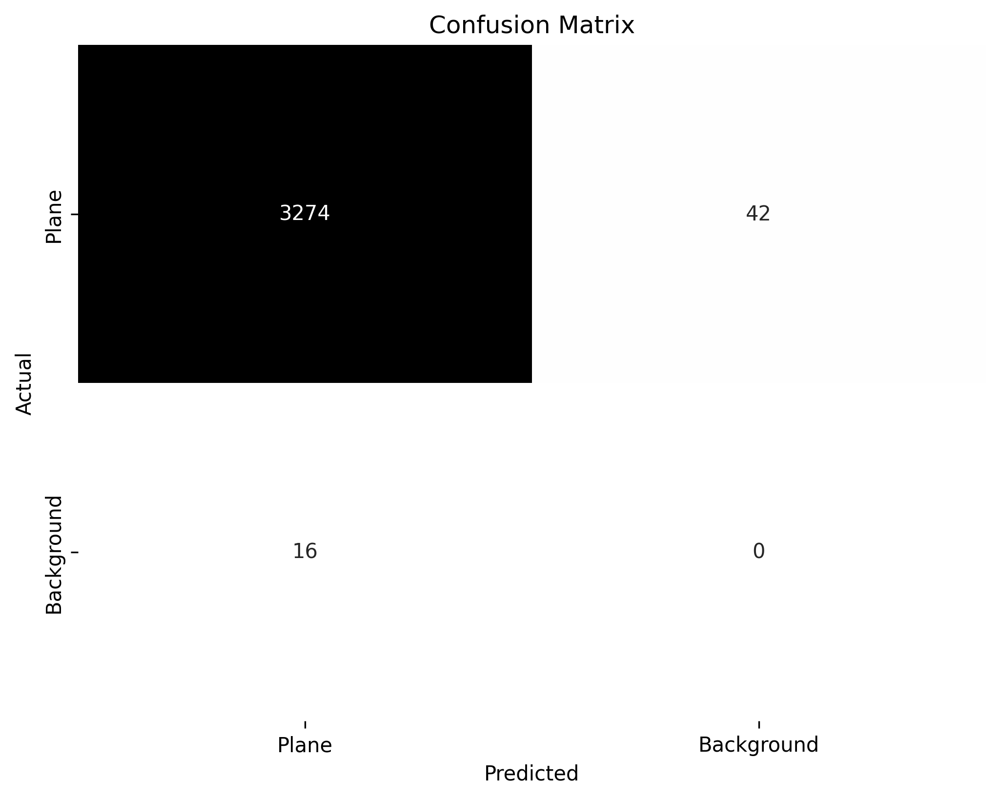

In [ ]:
plt.figure(figsize=(8, 6), dpi=300)
sns.heatmap(cm.astype(int), annot=True, fmt='d', cmap='Greys', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.xticks(ticks=[0.5, 1.5], labels=['Plane', 'Background'])
plt.yticks(ticks=[0.5, 1.5], labels=['Plane', 'Background'])
plt.savefig(f"{BASE_DIRECTORY}/outputs/confusion_matrix_customized.png")
plt.show()

In [ ]:
TP = int(cm[0][0])
FN = int(cm[1][0])
FP = int(cm[0][1])

accuracy = calculate_accuracy(TP, FN, FP)

print("Accuracy:", round(accuracy, 4))

Accuracy: 0.9826


### **2.4. Plot Best Results**

**mAP50 (mean Average Precision at 50)** is a metric commonly used in object detection tasks, including those using YOLO (You Only Look Once) models like YOLOv8x. It calculates the average precision of detecting objects across different categories at a specific intersection over union (IoU) threshold of 0.5.

<br>

**mAP50-95 (mean Average Precision from 50 to 95)** is an extension of mAP50 that calculates the average precision over a range of IoU thresholds, typically from 0.5 to 0.95, with a step size of 0.05. This metric provides a more comprehensive evaluation of the model's performance across a wider range of IoU thresholds, capturing its ability to detect objects with varying levels of overlap with ground truth annotations.

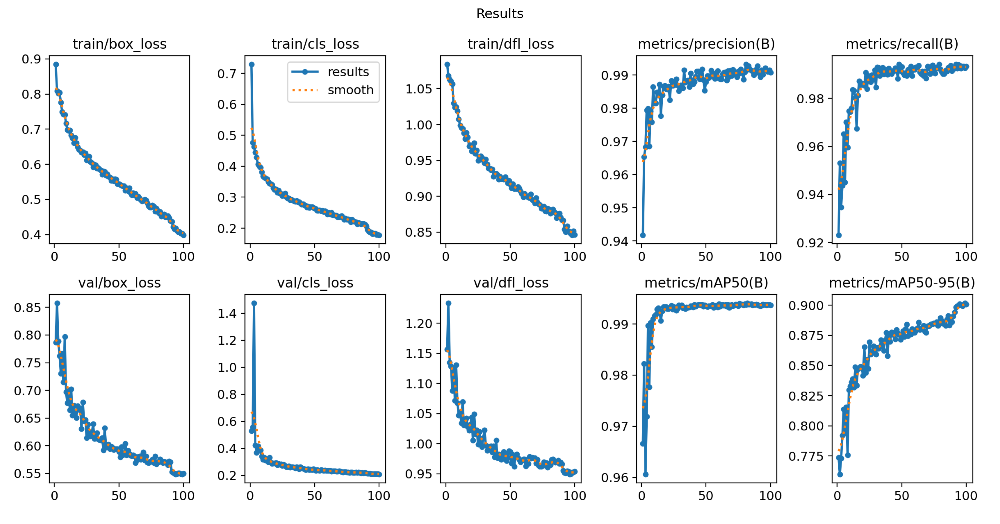

In [ ]:
image = mpimg.imread(f"/content/runs/detect/train/results.png")
plt.figure(figsize=(16, 9), dpi=300)
plt.title('Results')
plt.imshow(image)
plt.axis('off')
plt.show()

In [ ]:
csv_file_path = f"/content/runs/detect/train/results.csv"
df = pd.read_csv(csv_file_path)
df

,epoch,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,1,0.88506,0.72994,1.08420,0.94174,0.92310,0.96661,0.77375,0.78659,0.52870,1.15660,0.067243,0.000331,0.000331
1,2,0.80872,0.47712,1.06820,0.96535,0.95319,0.98227,0.75988,0.85766,0.55579,1.23340,0.034236,0.000658,0.000658
2,3,0.80145,0.46359,1.06310,0.96825,0.93465,0.96063,0.77295,0.78884,1.47520,1.13480,0.001223,0.000978,0.000978
3,4,0.80427,0.44442,1.06030,0.97946,0.94377,0.97194,0.79192,0.76225,0.42360,1.12880,0.000970,0.000970,0.000970
4,5,0.77578,0.42895,1.05640,0.97994,0.96522,0.98965,0.81392,0.73047,0.36872,1.08760,0.000960,0.000960,0.000960
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,96,0.40827,0.18286,0.84944,0.99210,0.99253,0.99378,0.90029,0.55069,0.21171,0.94942,0.000060,0.000060,0.000060
96,97,0.40783,0.18247,0.84764,0.99150,0.99327,0.99372,0.89956,0.55029,0.21194,0.94990,0.000050,0.000050,0.000050
97,98,0.40332,0.17901,0.84585,0.99101,0.99331,0.99377,0.90048,0.54878,0.20989,0.95260,0.000040,0.000040,0.000040
98,99,0.40270,0.17854,0.85165,0.99150,0.99256,0.99381,0.90177,0.54873,0.21003,0.95262,0.000030,0.000030,0.000030


### **2.5. Plot Labels and Predicted Results**

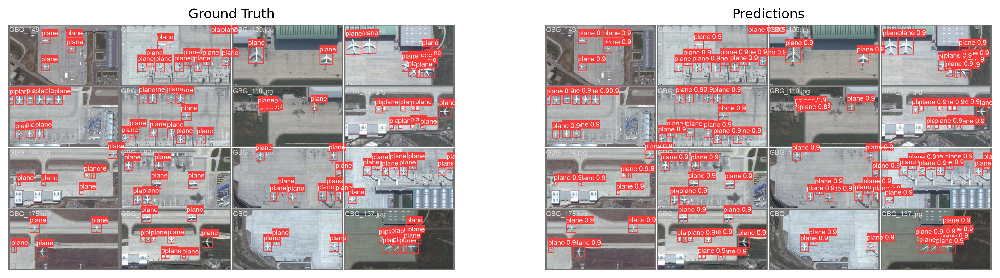

In [ ]:
image1 = mpimg.imread(f"/content/runs/detect/val/val_batch0_labels.jpg")
image2 = mpimg.imread(f"/content/runs/detect/val/val_batch0_pred.jpg")

fig, axes = plt.subplots(1, 2, figsize=(16, 9), dpi=300)
axes[0].imshow(image1)
axes[0].set_title('Ground Truth')
axes[0].axis('off')
axes[1].imshow(image2)
axes[1].set_title('Predictions')
axes[1].axis('off')
plt.savefig(f"{BASE_DIRECTORY}/outputs/label_pred.png")
plt.show()

## **3. Move Model Items into Google Drive**

Instead of uploading and downloading files, we can directly move them to the desired path.

In [ ]:
shutil.move("/content/runs/detect/", BASE_DIRECTORY)

'/gdrive/MyDrive/Datasets/HRPlanes/YOLOV8/YOLOv8x/Experiment_No_14/detect'

In [ ]:
from datetime import datetime
print(f"Changes have been made to the project on {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}")

Changes have been made to the project on 2024-05-02 10:16:41
